In [35]:
install.packages('Refs/Mlig_4_5.v5/BSgenome.Mlig.Eugene.Mlig45_1.0.0.tar.gz', 
                 repos = NULL, type="source")

In [1]:
library( ArchR )
library( BSgenome )
library( BSgenome.Mlig.Eugene.Mlig45 )
library( GenomeInfoDb )
library( GenomicFeatures )
library( GenomicRanges )
library( SingleCellExperiment )
library( anndata )
library( SoupX )
library( pheatmap )
library( zellkonverter )
library( rtracklayer )
library( Seurat )
library( ensembldb )


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .______      
          /   \     |   _ 

# Data import and preprocessing

## Set up the reference

In [2]:
addArchRThreads(threads = 1) 

Setting default number of Parallel threads to 1.



In [3]:
edb <- EnsDb(ensDbFromGtf(gtf='Refs/Mlig_4_5.v5/Mlig_RNA_4_5.v5.coregenes.Chew.gtf',
                          organism='Macrostomum lignano', genomeVersion='4_5', version=5))

Importing GTF file ... 
OK

Processing genes ... 

Warning message in ensDbFromGRanges(GTF, outfile = outfile, path = path, organism = organism, :
" I'm missing column(s): 'gene_name','entrezid','gene_biotype'. The corresponding database column(s) will be empty!"
 Attribute availability:

  o gene_id ... OK

  o gene_name ... Nope

  o entrezid ... Nope

  o gene_biotype ... Nope

OK

Processing transcripts ... 

Warning message in ensDbFromGRanges(GTF, outfile = outfile, path = path, organism = organism, :
"I'm missing column(s): 'transcript_name'. The corresponding database columns will be empty!"
 Attribute availability:

  o transcript_id ... OK

  o gene_id ... OK

  o source ... OK

  o transcript_name ... Nope

OK

Processing exons ... 
OK

Processing chromosomes ... 
Fetch seqlengths from ensembl ... 
Warning message in .getSeqlengthsFromMysqlFolder(organism = organism, ensembl = ensemblVersion, :
"Can not get the sequence lengths from Ensembl or Ensemblgenomes. Seqinfo will la

In [4]:
genes <- genes(edb)
genes <- as.data.frame( genes )
genes <- genes[,-c(7,8,9,10,11)]
rownames(genes) <- NULL
genes$gene_id <- sub('.gene','',genes$gene_id)
genes$symbol <- sub('.gene','',genes$gene_id)

genes <- makeGRangesFromDataFrame( genes, keep.extra.columns=T )

tss <- resize( genes, 1, 'start' )

genes$symbol <- genes$gene_id
genes$tx_id <- 1:length(genes)

exons <- exons(edb)
exons <- as.data.frame( exons )
rownames(exons) <- NULL
exons$gene_id <- sub('.[^.]+$','',exons$exon_id)
exons$symbol <- exons$gene_id
exons <- exons[,-c(6)]
exons <- makeGRangesFromDataFrame( exons, keep.extra.columns=T )

In [5]:
geneAnno <- createGeneAnnotation(exons = exons, genes = genes, TSS = tss)

In [4]:
genome <- getBSgenome("BSgenome.Mlig.Eugene.Mlig45")

In [7]:
chrRanges <- as( seqinfo(genome), "GRanges" )
blacklist <- chrRanges["ML45REF0000"]

In [3]:
addArchRChrPrefix(chrPrefix = FALSE)

genomeAnno <- createGenomeAnnotation( genome=genome, blacklist=blacklist, chromSizes=chrRanges )
####
# This next step is potentially necessary due to some ArchR bugs ...
genomeAnno$chromSizes <- genomeAnno$chromSizes[unique(seqnames(tss))]
####
genomeAnno

ArchR is now disabling the requirement of chromosome prefix = 'chr'



In [4]:
setwd( "ArchROutputs/Mlig/" )
getwd()

[1] "/media/gary/extdrv/Jesse/Mlig_Multiome/ArchR_Integration_Outputs"

## Read in the ATAC data

In [20]:
inputs <- c(uncut="../../FragmentFiles/Mlig/uncut_ATAC.trimbc.tsv.gz",
            head="../../FragmentFiles/Mlig/3H_ATAC.trimbc.tsv.gz",
            tail="../../FragmentFiles/Mlig/3T_ATAC.trimbc.tsv.gz")
inputs
names(inputs)

uncut 
"../chromap_out/uncut/uncut_ATAC.trimbc.tsv.gz" 
                                           head 
      "../chromap_out/3H/3H_ATAC.trimbc.tsv.gz" 
                                           tail 
      "../chromap_out/3T/3T_ATAC.trimbc.tsv.gz"

[1] "uncut" "head"  "tail"

In [22]:
TSSParams = list(window = 101, flank = 2000, norm = 100)
ArrowFiles <- createArrowFiles(
  inputFiles = inputs,
  sampleNames = names(inputs),
  geneAnnotation = geneAnno,
  genomeAnnotation = genomeAnno,
  minTSS = 2, #Dont set this too high because you can always increase later
  minFrags = 10^3.2, 
  addTileMat = TRUE,
  addGeneScoreMat = TRUE,
  TSSParams= TSSParams,
  excludeChr = c("NA", ""),
  force = TRUE
)

ArchR logging to : ArchRLogs/ArchR-createArrows-3cc44d0f9c0a-Date-2022-07-06_Time-19-43-08.log
If there is an issue, please report to github with logFile!

Cleaning Temporary Files

2022-07-06 19:43:08 : Batch Execution w/ safelapply!, 0 mins elapsed.

(tail : 1 of 3) Determining Arrow Method to use!

2022-07-06 19:43:08 : (tail : 1 of 3) Reading In Fragments from inputFiles (readMethod = tabix), 0 mins elapsed.

2022-07-06 19:43:08 : (tail : 1 of 3) Tabix Bed To Temporary File, 0 mins elapsed.

Warning message in sprintf("%s Reading TabixFile %s Percent", prefix, round(100 * :
"one argument not used by format '%s Reading TabixFile %s Percent'"
2022-07-06 19:43:25 : (tail : 1 of 3) Reading TabixFile 0 Percent, 0.291 mins elapsed.

Warning message in sprintf("%s Reading TabixFile %s Percent", prefix, round(100 * :
"one argument not used by format '%s Reading TabixFile %s Percent'"
2022-07-06 19:43:41 : (tail : 1 of 3) Reading TabixFile 1 Percent, 0.556 mins elapsed.

Warning message in 

In [23]:
ArrowFiles

[1] "tail.arrow"  "head.arrow"  "uncut.arrow"

In [24]:
# infer doublet
doubScores <- addDoubletScores(
    input = ArrowFiles,
    k = 10,
    knnMethod = "UMAP",
    LSIMethod = 1
)

ArchR logging to : ArchRLogs/ArchR-addDoubletScores-3cc41f0bf7bd-Date-2022-07-07_Time-02-42-06.log
If there is an issue, please report to github with logFile!

2022-07-07 02:42:06 : Batch Execution w/ safelapply!, 0 mins elapsed.

2022-07-07 02:42:06 : tail (1 of 3) :  Computing Doublet Statistics, 0 mins elapsed.

tail (1 of 3) : UMAP Projection R^2 = 0.99871

tail (1 of 3) : UMAP Projection R^2 = 0.99871

2022-07-07 02:57:42 : head (2 of 3) :  Computing Doublet Statistics, 15.601 mins elapsed.

head (2 of 3) : UMAP Projection R^2 = 0.9981

head (2 of 3) : UMAP Projection R^2 = 0.9981

2022-07-07 03:14:08 : uncut (3 of 3) :  Computing Doublet Statistics, 32.032 mins elapsed.

uncut (3 of 3) : UMAP Projection R^2 = 0.99817

uncut (3 of 3) : UMAP Projection R^2 = 0.99817

ArchR logging successful to : ArchRLogs/ArchR-addDoubletScores-3cc41f0bf7bd-Date-2022-07-07_Time-02-42-06.log



In [25]:
mlProj1 <- ArchRProject( ArrowFiles=ArrowFiles, outputDirectory="init_proj", copyArrows=TRUE,
                         geneAnnotation=geneAnno, genomeAnnotation=genomeAnno )
mlProj1

Validating Arrows...

Getting SampleNames...

1 
2 
3 


Copying ArrowFiles to Ouptut Directory! If you want to save disk space set copyArrows = FALSE

1 
2 
3 


Getting Cell Metadata...

1 
2 
3 


Merging Cell Metadata...

Initializing ArchRProject...


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '    

class: ArchRProject 
outputDirectory: /media/gary/extdrv/Jesse/Mlig_Multiome/ArchR_Integration_Outputs/ArchROut_fixed 
samples(3): tail head uncut
sampleColData names(1): ArrowFiles
cellColData names(15): Sample TSSEnrichment ... DoubletEnrichment
  BlacklistRatio
numberOfCells(1): 62133
medianTSS(1): 3.4
medianFrags(1): 5434

In [ ]:
saveArchRProject( mlProj1, 'ArchRProjs/init_proj' )

In [11]:
mlProj1 <- loadArchRProject( 'ArchRProjs/init_proj' )
mlProj1

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

class: ArchRProject 
outputDirectory: /media/gary/extdrv/Jesse/Mlig_Multiome/ArchR_Integration_Outputs/ArchROut_fixed 
samples(3): tail head uncut
sampleColData names(1): ArrowFiles
cellColData names(15): Sample TSSEnrichment ... DoubletEnrichment
  BlacklistRatio
numberOfCells(1): 62133
medianTSS(1): 3.4
medianFrags(1): 5434

## QC

[1] 21101

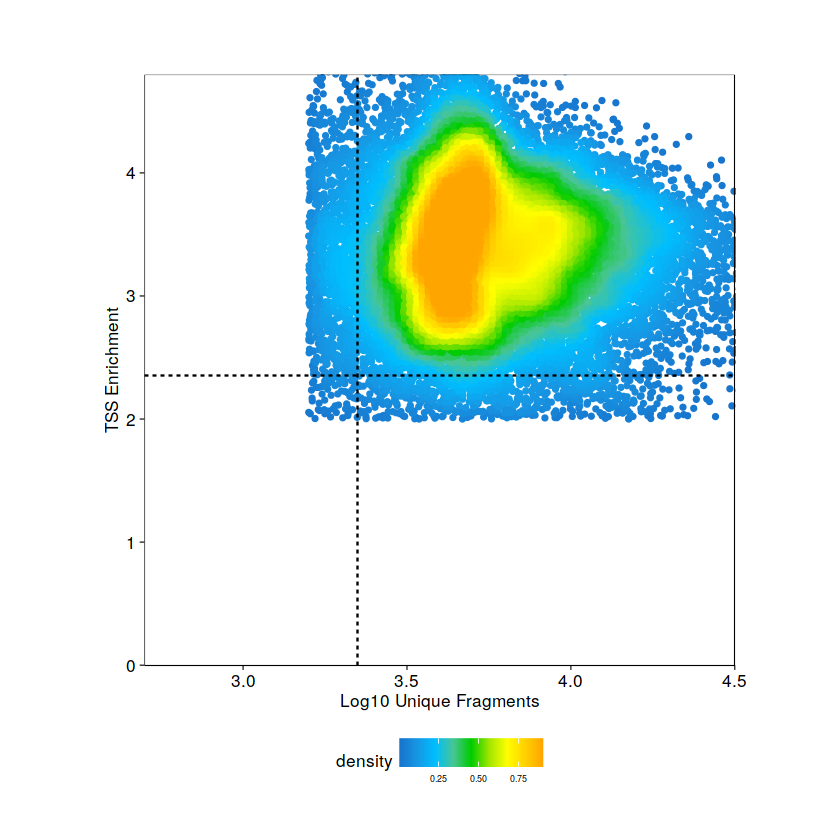

In [20]:
df <- getCellColData(mlProj1[mlProj1$Sample %bcin% c("uncut"),], select = c("log10(nFrags)", "TSSEnrichment"))
p <- ggPoint(
    x = df[,1], 
    y = df[,2], 
    colorDensity = TRUE,
    continuousSet = "sambaNight",
    xlabel = "Log10 Unique Fragments",
    ylabel = "TSS Enrichment",
    xlim = c(log10(500), quantile(df[,1], probs = 0.99)),
    ylim = c(0, quantile(df[,2], probs = 0.99))
) + geom_hline(yintercept = 2.35, lty = "dashed") + geom_vline(xintercept = 3.35, lty = "dashed")

length(rownames(df))

p

[1] 24918

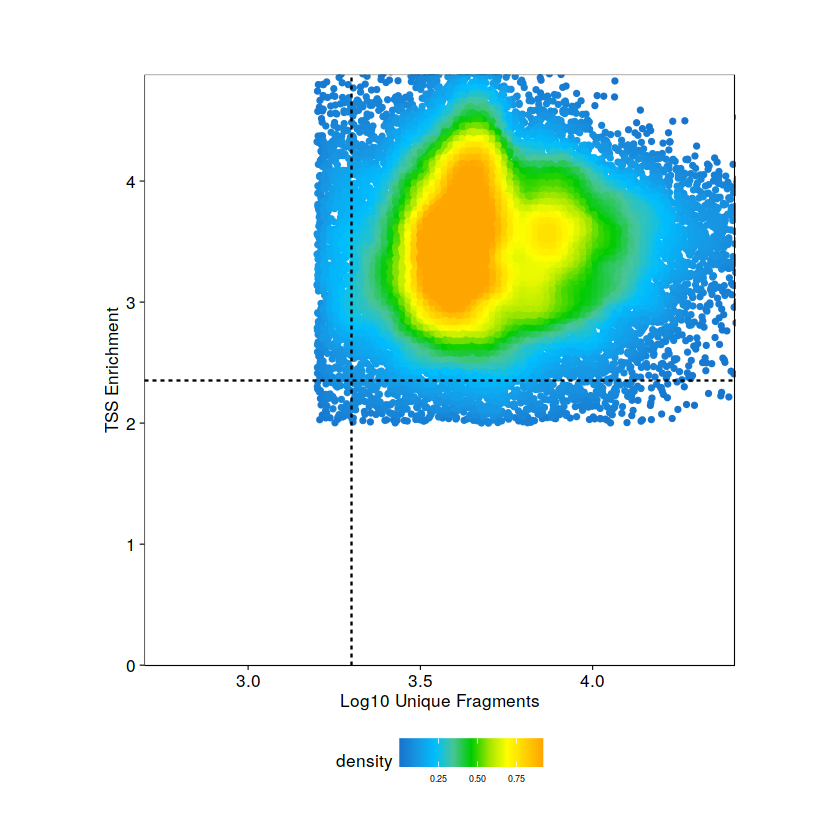

In [21]:
df <- getCellColData(mlProj1[mlProj1$Sample %bcin% c("head"),], select = c("log10(nFrags)", "TSSEnrichment"))
p <- ggPoint(
    x = df[,1], 
    y = df[,2], 
    colorDensity = TRUE,
    continuousSet = "sambaNight",
    xlabel = "Log10 Unique Fragments",
    ylabel = "TSS Enrichment",
    xlim = c(log10(500), quantile(df[,1], probs = 0.99)),
    ylim = c(0, quantile(df[,2], probs = 0.99))
) + geom_hline(yintercept = 2.35, lty = "dashed") + geom_vline(xintercept = 3.3, lty = "dashed")

length(rownames(df))

p

[1] 16114

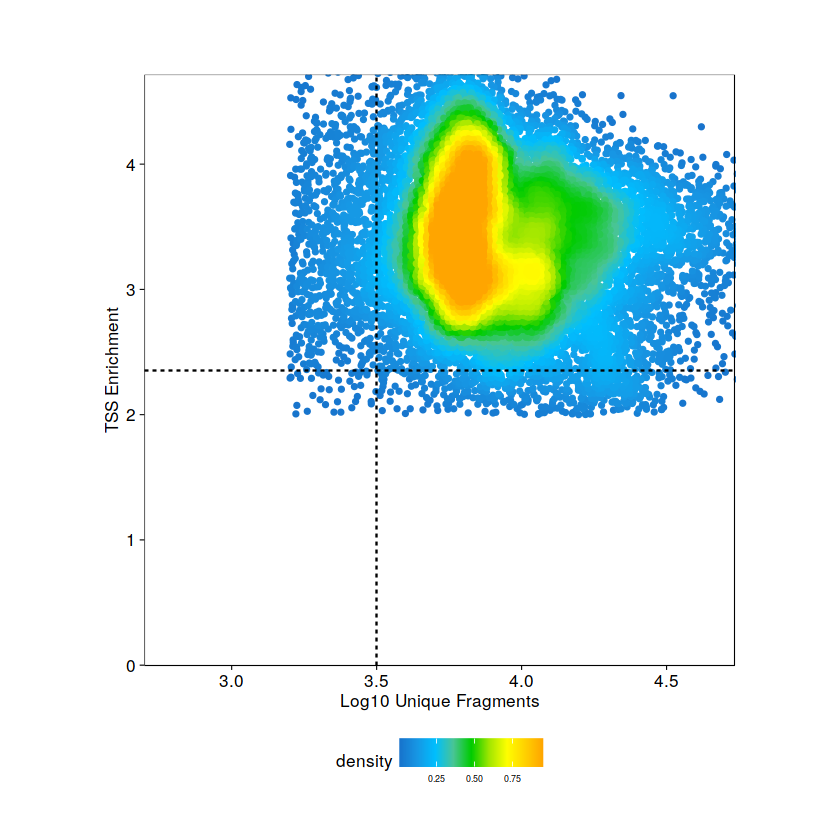

In [23]:
df <- getCellColData(mlProj1[mlProj1$Sample %bcin% c("tail"),], select = c("log10(nFrags)", "TSSEnrichment"))
p <- ggPoint(
    x = df[,1], 
    y = df[,2], 
    colorDensity = TRUE,
    continuousSet = "sambaNight",
    xlabel = "Log10 Unique Fragments",
    ylabel = "TSS Enrichment",
    xlim = c(log10(500), quantile(df[,1], probs = 0.99)),
    ylim = c(0, quantile(df[,2], probs = 0.99))
) + geom_hline(yintercept = 2.35, lty = "dashed") + geom_vline(xintercept = 3.5, lty = "dashed")

length(rownames(df))

p

In [24]:
# Move up the thresholds on the uncut library
mlProj2 <- mlProj1[ mlProj1$Sample %bcin% c("head","tail") | ( mlProj1$TSSEnrichment >= 2.35 & mlProj1$nFrags >= 10^3.35), ]
# Move up the thresholds on the head library
mlProj2 <- mlProj2[ mlProj2$Sample %bcin% c("uncut","tail") | ( mlProj2$TSSEnrichment >= 2.35 & mlProj2$nFrags >= 10^3.3), ]
# Move up the thresholds on the tail library
mlProj2 <- mlProj2[ mlProj2$Sample %bcin% c("head","uncut") | ( mlProj2$TSSEnrichment >= 2.35 & mlProj2$nFrags >= 10^3.5), ]

mlProj2


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /media/gary/extdrv/Jesse/Mlig_Multiome/ArchR_Integration_Outputs/ArchROut_fixed 
samples(3): tail head uncut
sampleColData names(1): ArrowFiles
cellColData names(15): Sample TSSEnrichment ... DoubletEnrichment
  BlacklistRatio
numberOfCells(1): 56939
medianTSS(1): 3.428
medianFrags(1): 5649

1 




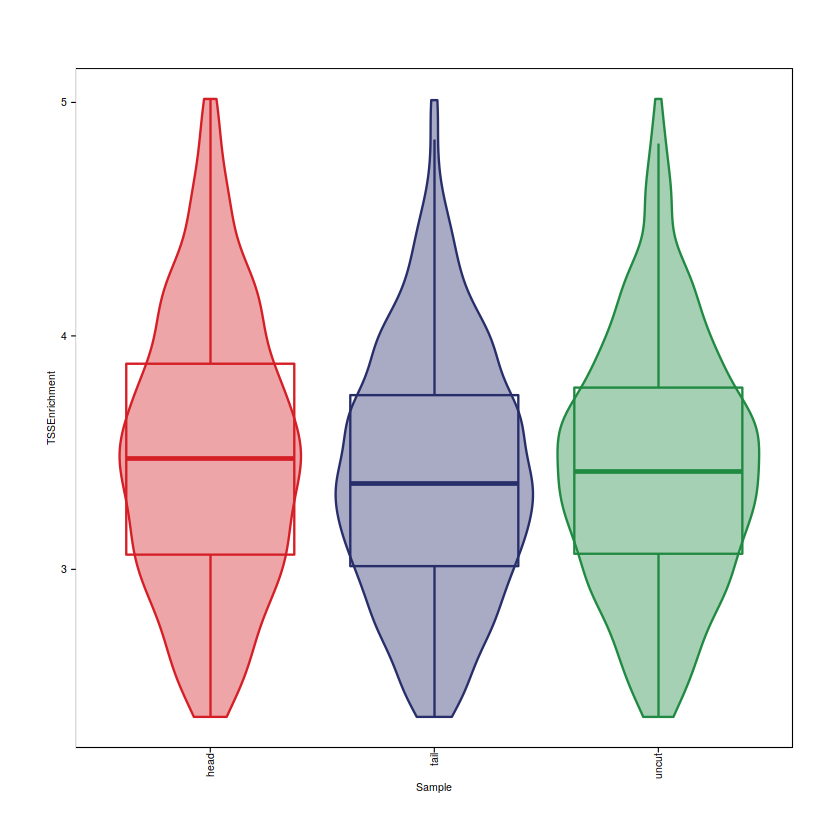

In [25]:
p <- plotGroups(
    ArchRProj = mlProj2, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "TSSEnrichment",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )
p

1 




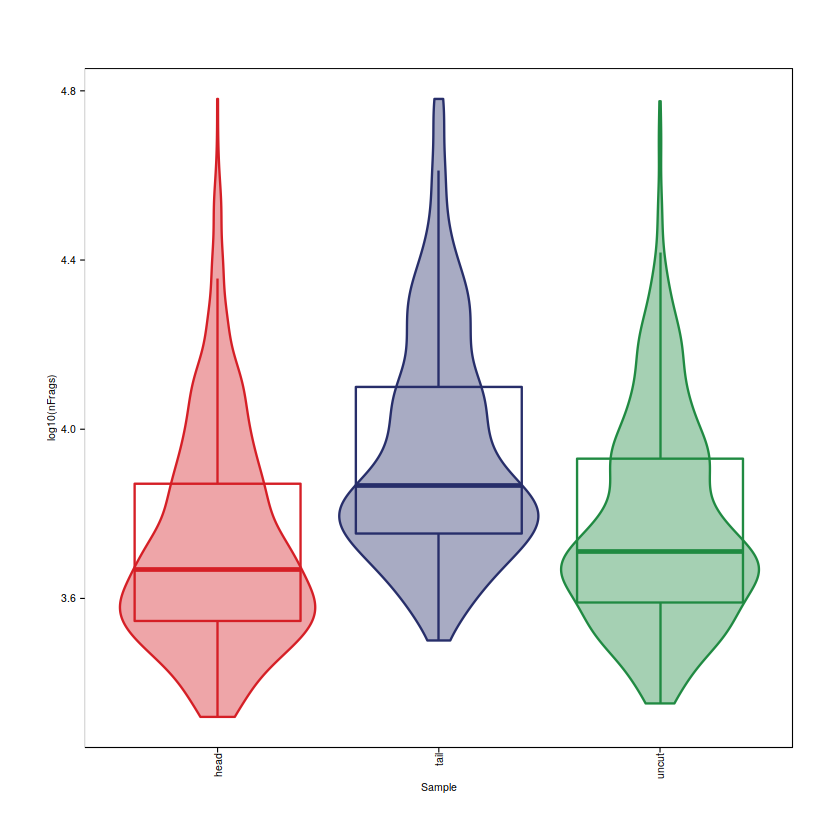

In [26]:
p <- plotGroups(
    ArchRProj = mlProj2, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "log10(nFrags)",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )

p

In [27]:
saveArchRProject(ArchRProj = mlProj2, outputDirectory = "ArchRProjs/re_threshold/", load = FALSE)

Copying ArchRProject to new outputDirectory : /media/gary/extdrv/Jesse/Mlig_Multiome/ArchR_Integration_Outputs/ArchRProjs/unfiltered_2

Copying Arrow Files...

Copying Arrow Files (1 of 3)

Copying Arrow Files (2 of 3)

Copying Arrow Files (3 of 3)

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Saving ArchRProject...



In [20]:
mlProj2 <- loadArchRProject( "ArchRProjs/re_threshold/" )

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

## Clustering

In [136]:
mlProj3 <- filterDoublets( mlProj2, filterRatio=2, cutEnrich=0.2 )

sum(mlProj3$Sample %bcin% c("uncut"))
sum(mlProj3$Sample %bcin% c("head"))
sum(mlProj3$Sample %bcin% c("tail"))

Filtering 19228 cells from ArchRProject!

	tail : 4264 of 14603 (29.2%)

	head : 7745 of 23187 (33.4%)

	uncut : 7219 of 19149 (37.7%)



[1] 11930

[1] 15442

[1] 10339

In [137]:
mlProj3 <- addIterativeLSI( ArchRProj=mlProj3, useMatrix="TileMatrix", name="IterativeLSI", iterations=2,
                            clusterParams=list(resolution=c(2),sampleCells=9500,n.start=10),
                            varFeatures=25000, dimsToUse=1:30 )

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-4cd64b0b1065-Date-2022-07-12_Time-13-43-25.log
If there is an issue, please report to github with logFile!

2022-07-12 13:43:34 : Computing Total Across All Features, 0.143 mins elapsed.

2022-07-12 13:43:46 : Computing Top Features, 0.349 mins elapsed.

###########
2022-07-12 13:43:47 : Running LSI (1 of 2) on Top Features, 0.366 mins elapsed.
###########

2022-07-12 13:43:47 : Sampling Cells (N = 10001) for Estimated LSI, 0.367 mins elapsed.

2022-07-12 13:43:47 : Creating Sampled Partial Matrix, 0.367 mins elapsed.

2022-07-12 13:44:39 : Computing Estimated LSI (projectAll = FALSE), 1.228 mins elapsed.

2022-07-12 13:44:52 : Identifying Clusters, 1.45 mins elapsed.

2022-07-12 13:45:02 : Identified 25 Clusters, 1.61 mins elapsed.

2022-07-12 13:45:02 : Saving LSI Iteration, 1.61 mins elapsed.

Length of unique values greater than palette, interpolating..

2022-07-12 13:45:23 : Creating Cluster Matrix on the total

In [138]:
mlProj3 <- addUMAP( ArchRProj = mlProj3, reducedDims = "IterativeLSI", name = "UMAP",
                    nNeighbors = 30, minDist = 0.5, metric = "cosine" )

14:01:38 UMAP embedding parameters a = 0.583 b = 1.334

14:01:38 Read 37711 rows and found 30 numeric columns

14:01:38 Using Annoy for neighbor search, n_neighbors = 30

14:01:38 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:01:41 Writing NN index file to temp file /tmp/RtmpwHp5Lc/file4cd65f8452a9

14:01:41 Searching Annoy index using 6 threads, search_k = 3000

14:01:44 Annoy recall = 100%

14:01:45 Commencing smooth kNN distance calibration using 6 threads

14:01:46 Initializing from normalized Laplacian + noise

14:01:50 Commencing optimization for 200 epochs, with 1626354 positive edges

14:02:05 Optimization finished

14:02:05 Creating temp model dir /tmp/RtmpwHp5Lc/dir4cd6539f8c59

14:02:05 Creating dir /tmp/RtmpwHp5Lc/dir4cd6539f8c59

14:02:09 Changing to 

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4cd670ed88e0-Date-2022-07-12_Time-14-02-10.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4cd670ed88e0-Date-2022-07-12_Time-14-02-10.log



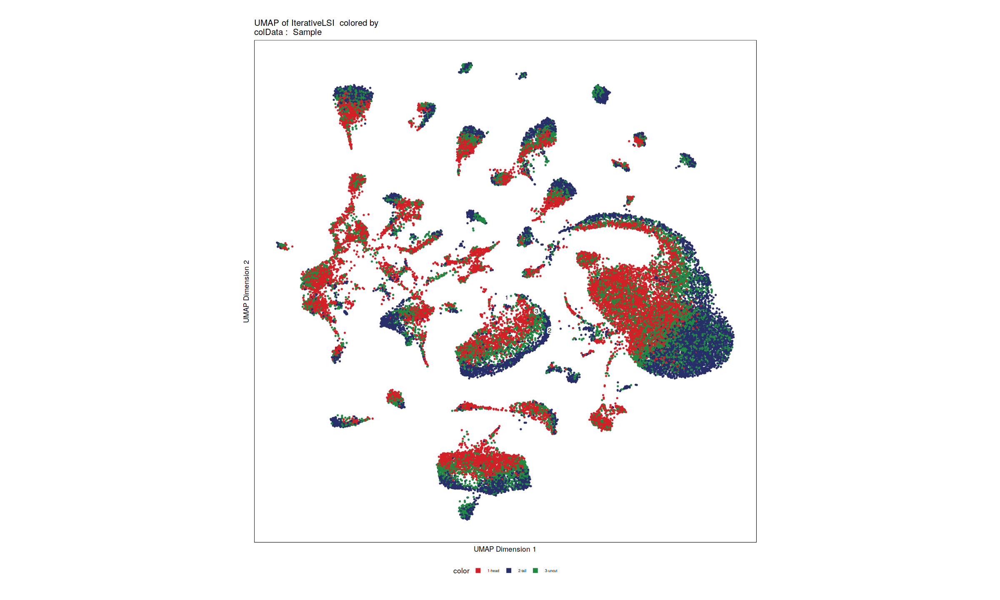

In [139]:
p <- plotEmbedding(ArchRProj = mlProj3, colorBy = "cellColData", name = "Sample", embedding = "UMAP")

options(repr.plot.width=20, repr.plot.height=12)
p

In [140]:
mlProj3 <- addHarmony(
    ArchRProj = mlProj3,
    reducedDims = "IterativeLSI",
    name = "Harmony",
    groupBy = "Sample"
)

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 1885550)"
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



In [141]:
mlProj3 <- addUMAP( ArchRProj = mlProj3, reducedDims = "Harmony", name = "UMAP-Harmony",
                    nNeighbors = 30, minDist = 0.5, metric = "cosine" )

14:02:49 UMAP embedding parameters a = 0.583 b = 1.334

14:02:49 Read 37711 rows and found 30 numeric columns

14:02:49 Using Annoy for neighbor search, n_neighbors = 30

14:02:49 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:02:53 Writing NN index file to temp file /tmp/RtmpwHp5Lc/file4cd64405ddfc

14:02:53 Searching Annoy index using 6 threads, search_k = 3000

14:02:55 Annoy recall = 100%

14:02:57 Commencing smooth kNN distance calibration using 6 threads

14:02:59 Initializing from normalized Laplacian + noise

14:03:04 Commencing optimization for 200 epochs, with 1649564 positive edges

14:03:22 Optimization finished

14:03:22 Creating temp model dir /tmp/RtmpwHp5Lc/dir4cd679b49d0

14:03:22 Creating dir /tmp/RtmpwHp5Lc/dir4cd679b49d0

14:03:24 Changing to /t

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4cd637f42114-Date-2022-07-12_Time-14-03-25.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4cd637f42114-Date-2022-07-12_Time-14-03-25.log



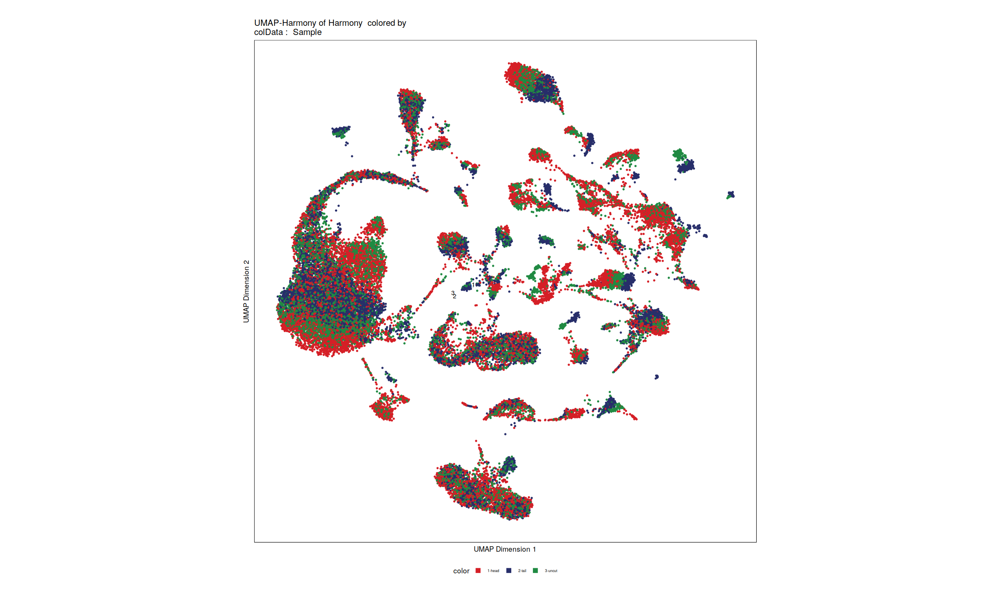

In [142]:
p <- plotEmbedding(ArchRProj = mlProj3, colorBy = "cellColData", name = "Sample", embedding = "UMAP-Harmony")

options(repr.plot.width=20, repr.plot.height=12)
p

In [143]:
mlProj3 <- addClusters( input=mlProj3, reducedDims="Harmony", method="Seurat", name="SeuratClusters", resolution=1.5, force=T, maxClusters=40 )

ArchR logging to : ArchRLogs/ArchR-addClusters-4cd65d63c2c3-Date-2022-07-12_Time-14-03-29.log
If there is an issue, please report to github with logFile!

2022-07-12 14:03:29 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.001 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 37711
Number of edges: 1504258

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9186
Number of communities: 66
Elapsed time: 6 seconds


2022-07-12 14:04:06 : Testing Biased Clusters, 0.625 mins elapsed.

2022-07-12 14:04:07 : Identified Biased Clusters (n = 3), set filterBias = TRUE to re-assign these cells: , 0.638 mins elapsed.

Biased Clusters : 
Cluster1 
Cluster5 
Cluster7 


2022-07-12 14:04:07 : Testing Outlier Clusters, 0.638 mins elapsed.

2022-07-12 14:04:07 : Identified more clusters than maxClusters allowed (n = 0). Merging clusters to maxClusters (n = 40).
If this is not desired set maxClusters = NULL!, 0.638 mins elapsed.

2022-07-12 14:04:07 : Assigning Cluster Names to 40 Clusters, 0.638 mins elapsed.

2022-07-12 14:04:07 : Finished addClusters, 0.639 mins elapsed.



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4cd6712a37e8-Date-2022-07-12_Time-14-04-07.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4cd6712a37e8-Date-2022-07-12_Time-14-04-07.log



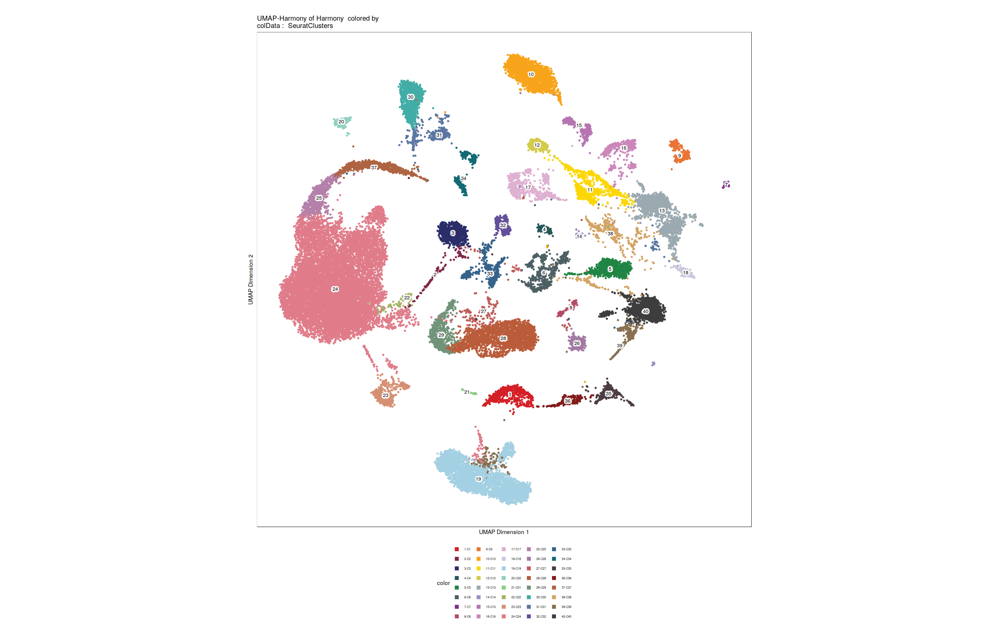

In [144]:
p <- plotEmbedding(ArchRProj = mlProj3, colorBy = "cellColData", name = "SeuratClusters", embedding = "UMAP-Harmony")

options(repr.plot.width=25, repr.plot.height=16)
p

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4cd66a9b0f89-Date-2022-07-12_Time-14-04-11.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4cd66a9b0f89-Date-2022-07-12_Time-14-04-11.log



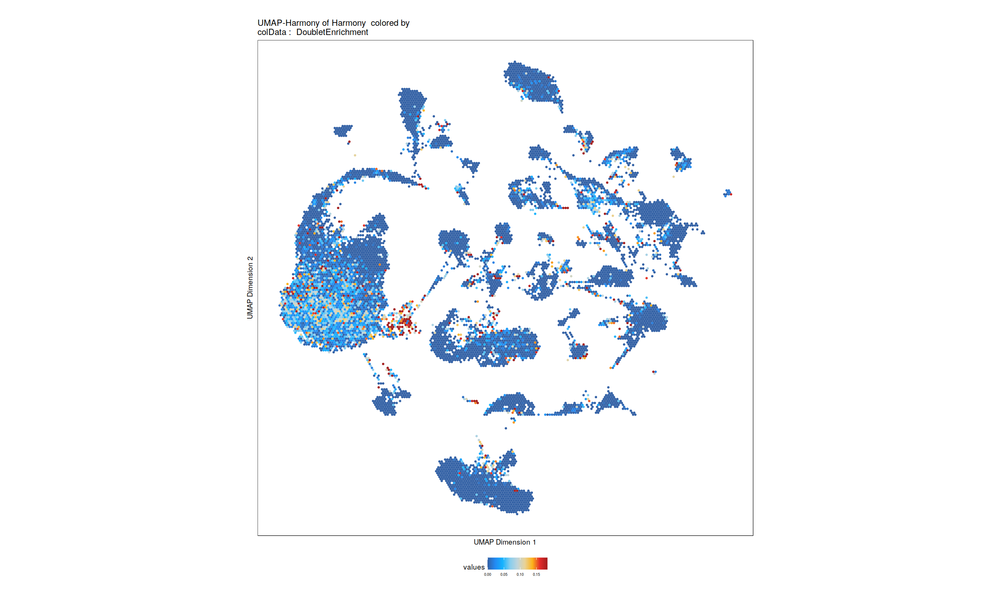

In [145]:
p <- plotEmbedding(ArchRProj = mlProj3, colorBy = "cellColData", name = "DoubletEnrichment", embedding = "UMAP-Harmony")

options(repr.plot.width=20, repr.plot.height=12)
p 

We notice that some clusters seem to have higher doublet enrichment scores

Length of unique values greater than palette, interpolating..

1 


Picking joint bandwidth of 0.00835



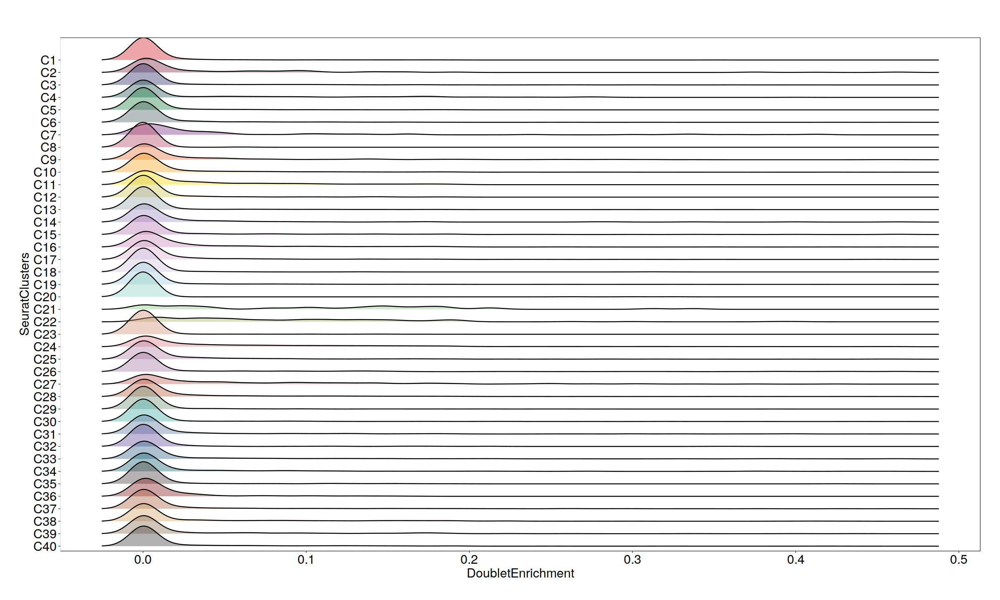

In [146]:
# Plot doublet enrichment values per cluster
p <- plotGroups(
    ArchRProj = mlProj3, 
    groupBy = "SeuratClusters", 
    colorBy = "cellColData", 
    name = "DoubletEnrichment",
    plotAs = "ridges",
    maxCells=50000,
    alpha = 0.4,
    addBoxPlot = TRUE,
    baseSize=18
   )

p

Clusters 21, 22 look suspicious. Plot distributions to verify

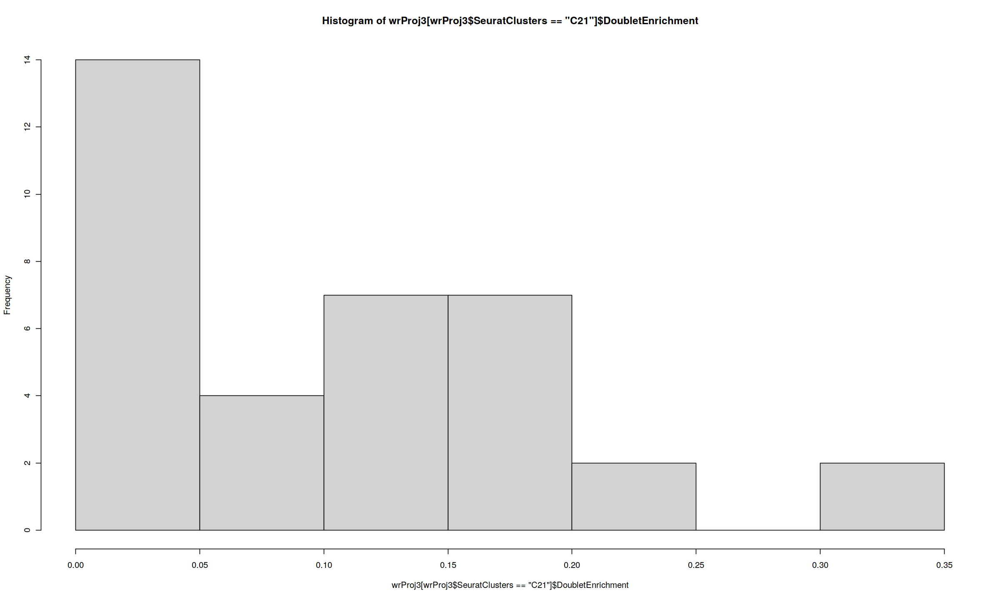

In [148]:
hist( mlProj3[mlProj3$SeuratClusters=='C21']$DoubletEnrichment )

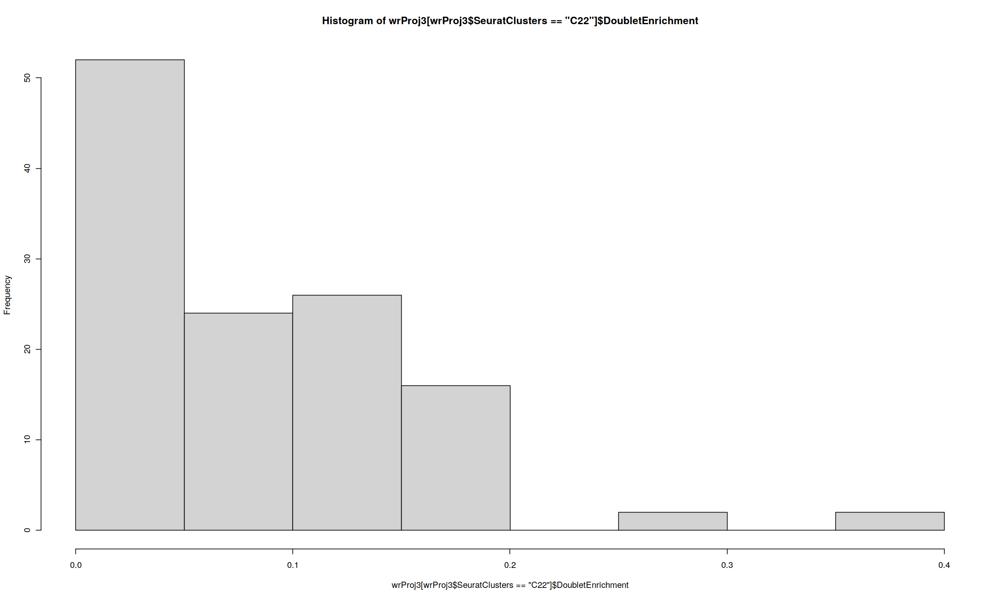

In [149]:
hist( mlProj3[mlProj3$SeuratClusters=='C22']$DoubletEnrichment )

In [150]:
# Drop these two clusters
mlProj3 <- mlProj3[mlProj3$SeuratClusters %bcni% c('C21','C22')]

In [153]:
saveArchRProject(ArchRProj = mlProj3, outputDirectory = "ArchRProjs/doubfiltered/", load = FALSE)

Copying ArchRProject to new outputDirectory : /media/gary/extdrv/Jesse/Mlig_Multiome/ArchR_Integration_Outputs/ArchRProjs/doubfiltered_2

Copying Arrow Files...

Copying Arrow Files (1 of 3)

Copying Arrow Files (2 of 3)

Copying Arrow Files (3 of 3)

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 3): Embeddings

Copying Other Files (2 of 3): IterativeLSI

Copying Other Files (3 of 3): RNALSI

Saving ArchRProject...



In [11]:
mlProj3 <- loadArchRProject( 'ArchRProjs/doubfiltered/' )

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

## Adding RNA data

In [14]:
bcRNA <- readLines( "../../Refs/737K-arc-v1.all.txt" )
bcATAC <- readLines( "../../Refs/737K-arc-v1.atac.revcomp.unsrt.txt")

Warning message in readLines("../../Refs/737K-arc-v1.all.txt"):
"incomplete final line found on '../../Refs/737K-arc-v1.all.txt'"
Warning message in readLines("../../Refs/737K-arc-v1.atac.revcomp.unsrt.txt"):
"incomplete final line found on '../../Refs/737K-arc-v1.atac.revcomp.unsrt.txt'"


In [15]:
geneOrder <- getGenes(mlProj3)$symbol

In [16]:
Xu <- ReadMtx( mtx="../../GEXCounts/Mlig/kallisto_out/uncut/counts_unfiltered/cells_x_genes.mtx",
               cells="../../GEXCounts/Mlig/kallisto_out/uncut/counts_unfiltered/cells_x_genes.barcodes.txt",
               features="../../GEXCounts/Mlig/kallisto_out/uncut/counts_unfiltered/cells_x_genes.genes.txt",
               feature.column=1, mtx.transpose=T )

# Remove mitochondrial transcripts
Xu <- Xu[!startsWith( rownames(Xu), "Mlig9" ),]
# Translate barcodes
colnames(Xu) <- paste0( "uncut#",  data.frame( bcRNA, bcATAC, row.names=1 )[colnames(Xu),] )
# Re-order to fit what's expected in the GTF
Xu <- Xu[geneOrder,]

In [17]:
Xh <- ReadMtx( mtx="../../GEXCounts/Mlig/kallisto_out/3H/counts_unfiltered/cells_x_genes.mtx",
                cells="../../GEXCounts/Mlig/kallisto_out/3H/counts_unfiltered/cells_x_genes.barcodes.txt",
                features="../../GEXCounts/Mlig/kallisto_out/3H/counts_unfiltered/cells_x_genes.genes.txt",
                feature.column=1, mtx.transpose=T )

Xh <- Xh[!startsWith( rownames(Xh), "Mlig9" ),]
colnames(Xh) <- paste0( "head#",  data.frame( bcRNA, bcATAC, row.names=1 )[colnames(Xh),] )
Xh <- Xh[geneOrder,]

In [20]:
Xt <- ReadMtx( mtx="../../GEXCounts/Mlig/kallisto_out/3T/counts_unfiltered/cells_x_genes.mtx",
                cells="../../GEXCounts/Mlig/kallisto_out/3T/counts_unfiltered/cells_x_genes.barcodes.txt",
                features="../../GEXCounts/Mlig/kallisto_out/3T/counts_unfiltered/cells_x_genes.genes.txt",
                feature.column=1, mtx.transpose=T )

Xt <- Xt[!startsWith( rownames(Xt), "Mlig9" ),]
colnames(Xt) <- paste0( "tail#",  data.frame( bcRNA, bcATAC, row.names=1 )[colnames(Xt),] )
Xt <- Xt[geneOrder,]

In [21]:
X <- cbind( Xu, Xh, Xt )
X

   [[ suppressing 32 column names 'uncut#GTAACACACCCGCTGT', 'uncut#AAGAACAACCCGCTGT', 'uncut#GCCTGTTACCCGCTGT' ... ]]

   [[ suppressing 32 column names 'uncut#GTAACACACCCGCTGT', 'uncut#AAGAACAACCCGCTGT', 'uncut#GCCTGTTACCCGCTGT' ... ]]

   [[ suppressing 32 column names 'uncut#GTAACACACCCGCTGT', 'uncut#AAGAACAACCCGCTGT', 'uncut#GCCTGTTACCCGCTGT' ... ]]



71174 x 2192336 sparse Matrix of class "dgCMatrix"
                                                                                     
Mlig455_000001 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000002 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000003 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000004 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000005 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000006 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000007 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000008 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000009 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000010 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mli

In [22]:
sceRNA <- SummarizedExperiment( list(counts=X[,colnames(X) %bcin% mlProj3$cellNames]), rowRanges=getGenes(mlProj3) )

sceRNA

class: RangedSummarizedExperiment 
dim: 71174 37553 
metadata(0):
assays(1): counts
rownames(71174): Mlig455_000001 Mlig455_000002 ... Mlig455_071162
  Mlig455_071156
rowData names(3): gene_id symbol tx_id
colnames(37553): uncut#CTTCGTAACCCGCTGT uncut#GAGGAACACCCGCTGT ...
  tail#TTAGTGCTGAAGTACG tail#TCACGATTGAAGTACG
colData names(0):

### SoupX to clean

313 genes passed tf-idf cut-off and 214 soup quantile filter.  Taking the top 100.

Using 2266 independent estimates of rho.

Estimated global rho of 0.15

Warning message in sparseMatrix(i = out@i[w] + 1, j = out@j[w] + 1, x = out@x[w], :
"'giveCsparse' has been deprecated; setting 'repr = "T"' for you"
Expanding counts from 38 clusters to 37553 cells.

   [[ suppressing 32 column names 'uncut#CTTCGTAACCCGCTGT', 'uncut#GAGGAACACCCGCTGT', 'uncut#CTTCCTCACCCGCTGT' ... ]]

   [[ suppressing 32 column names 'uncut#CTTCGTAACCCGCTGT', 'uncut#GAGGAACACCCGCTGT', 'uncut#CTTCCTCACCCGCTGT' ... ]]

   [[ suppressing 32 column names 'uncut#CTTCGTAACCCGCTGT', 'uncut#GAGGAACACCCGCTGT', 'uncut#CTTCCTCACCCGCTGT' ... ]]



71174 x 37553 sparse Matrix of class "dgCMatrix"
                                                                                     
Mlig455_000001 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000002 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000003 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000004 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000005 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000006 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000007 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000008 . . . . . . . . . . . . . . . . . . . . . . . . . . . 1 . . . . ......
Mlig455_000009 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig455_000010 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Mlig4

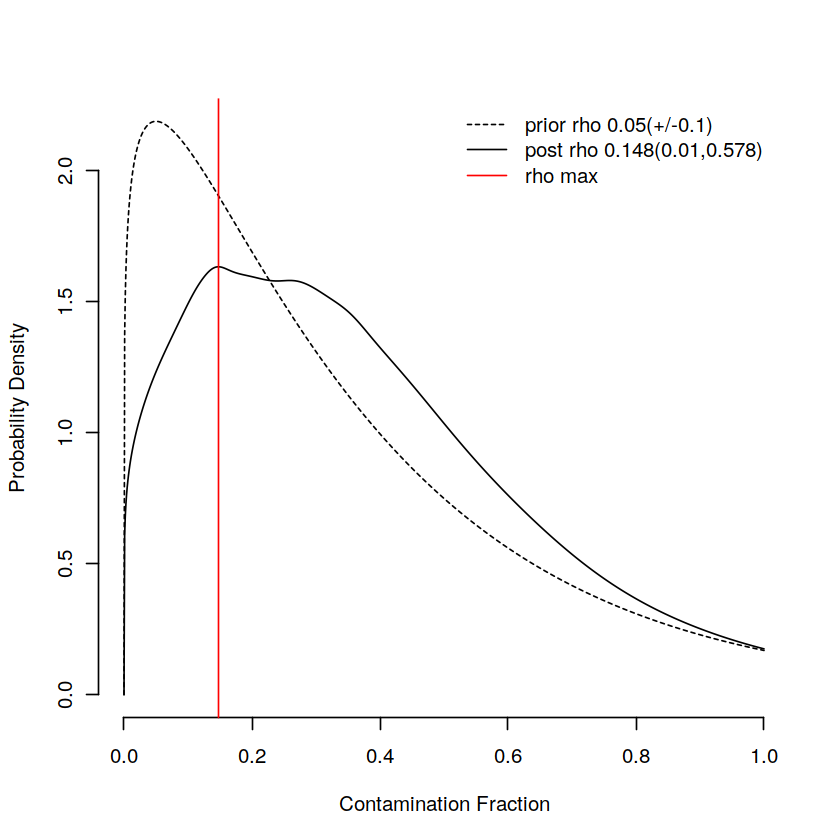

In [24]:
soup <- SoupChannel( X, X[,colnames(X) %bcin% mlProj3$cellNames] )
cl <- mlProj3$SeuratClusters
names(cl) <- mlProj3$cellNames
soup <- setClusters( soup, cl )
soup <- autoEstCont( soup )
adjSoup <- adjustCounts( soup, roundToInt=T )
adjSoup

In [26]:
sceSoup <- SummarizedExperiment( list(counts=adjSoup), rowRanges=geneAnno$genes )

sceSoup

class: RangedSummarizedExperiment 
dim: 71174 37553 
metadata(0):
assays(1): counts
rownames(71174): Mlig455_000001 Mlig455_000002 ... Mlig455_071162
  Mlig455_071156
rowData names(3): gene_id symbol tx_id
colnames(37553): uncut#CTTCGTAACCCGCTGT uncut#GAGGAACACCCGCTGT ...
  tail#TTAGTGCTGAAGTACG tail#TCACGATTGAAGTACG
colData names(0):

In [121]:
rowSums(assay(sceSoup)>0)

Mlig455_000001 Mlig455_000002 Mlig455_000003 Mlig455_000004 Mlig455_000005 
             8             29              1             72            165 
Mlig455_000006 Mlig455_000007 Mlig455_000008 Mlig455_000009 Mlig455_000010 
            59             87            439              0             34 
Mlig455_000011 Mlig455_000012 Mlig455_000013 Mlig455_000014 Mlig455_000015 
             1             13              0              0              2 
Mlig455_000016 Mlig455_000017 Mlig455_000018 Mlig455_000019 Mlig455_000020 
           109            467            775              9             11 
Mlig455_000021 Mlig455_000022 Mlig455_000023 Mlig455_000024 Mlig455_000025 
            51            149            107             12            221 
Mlig455_000026 Mlig455_000027 Mlig455_000028 Mlig455_000029 Mlig455_000030 
            88              1             12              1              0 
Mlig455_000031 Mlig455_000032 Mlig455_000033 Mlig455_000034 Mlig455_000035 
            30            113             67             10              6 
Mlig455_000036 Mlig455_000037 Mlig455_000038 Mlig455_000039 Mlig455_000040 
             0            116             52             88             36 
Mlig455_000041 Mlig455_000042 Mlig455_000043 Mlig455_000044 Mlig455_000045 
           464             39              0            159              2 
Mlig455_000046 Mlig455_000047 Mlig455_000048 Mlig455_000049 Mlig455_000050 
            21              2             10              0              7 
Mlig455_000051 Mlig455_000052 Mlig455_000053 Mlig455_000054 Mlig455_000055 
           338            169            198            787            106 
Mlig455_000056 Mlig455_000057 Mlig455_000058 Mlig455_000059 Mlig455_000060 
            79            153              7             18            384 
Mlig455_000061 Mlig455_000062 Mlig455_000063 Mlig455_000064 Mlig455_000065 
           122             20             47             24              6 
Mlig455_000066 Mlig455_000067 Mlig455_000068 Mlig455_000069 Mlig455_000070 
             7              0             20              1            362 
Mlig455_000071 Mlig455_000072 Mlig455_000073 Mlig455_000074 Mlig455_000075 
           431            761           1367           1546            155 
Mlig455_000076 Mlig455_000077 Mlig455_000078 Mlig455_000079 Mlig455_000080 
          2006             79           1482             74             12 
Mlig455_000081 Mlig455_000082 Mlig455_000083 Mlig455_000084 Mlig455_000085 
           206              4            304             60             57 
Mlig455_000086 Mlig455_000087 Mlig455_000088 Mlig455_000089 Mlig455_000090 
          3514             58             33             50            200 
Mlig455_000091 Mlig455_000092 Mlig455_000093 Mlig455_000094 Mlig455_000095 
           125             74            156            165             66 
Mlig455_000096 Mlig455_000097 Mlig455_000098 Mlig455_000099 Mlig455_000100 
           320             51            417             22             69 
Mlig455_000101 Mlig455_000102 Mlig455_000103 Mlig455_000104 Mlig455_000105 
             0              2            109              0             71 
Mlig455_000106 Mlig455_000107 Mlig455_000108 Mlig455_000109 Mlig455_000110 
            21            183              0             18             57 
Mlig455_000111 Mlig455_000112 Mlig455_000113 Mlig455_000114 Mlig455_000115 
             6             41             63            223            247 
Mlig455_000116 Mlig455_000117 Mlig455_000118 Mlig455_000119 Mlig455_000120 
           285             13             54             14            240 
Mlig455_000121 Mlig455_000122 Mlig455_000123 Mlig455_000124 Mlig455_000125 
             1              0              7             33            280 
Mlig455_000126 Mlig455_000127 Mlig455_000128 Mlig455_000129 Mlig455_000130 
           371              1             44              7            257 
Mlig455_000131 Mlig455_000132 Mlig455_000133 Mli

In [27]:
mlProj4 <- addGeneExpressionMatrix(input=mlProj3, seRNA=sceSoup, force=TRUE)
mlProj4 <- mlProj4[!is.na(mlProj4$Gex_nUMI)]
mlProj4

ArchR logging to : ArchRLogs/ArchR-addGeneExpressionMatrix-4675156a3bf0-Date-2022-07-14_Time-20-11-29.log
If there is an issue, please report to github with logFile!

Overlap w/ scATAC = 1

2022-07-14 20:11:29 : 

Overlap Per Sample w/ scATAC : head=15348,tail=10319,uncut=11886

2022-07-14 20:11:29 : 

2022-07-14 20:11:41 : Batch Execution w/ safelapply!, 0 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2022-07-14 20:13:20 : Adding head to GeneExpressionMatrix for Chr (1 of 414)!, 1.657 mins elapsed.

2022-07-14 20:13:22 : Adding head to GeneExpressionMatrix for Chr (2 of 414)!, 1.688 mins elapsed.

2022-07-14 20:13:24 : Adding head to GeneExpressionMatrix for Chr (3 of 414)!, 1.718 min

class: ArchRProject 
outputDirectory: /media/gary/extdrv/Jesse/Mlig_Multiome/ArchR_Integration_Outputs/ArchRProjs/doubfiltered_2 
samples(3): head tail uncut
sampleColData names(1): ArrowFiles
cellColData names(20): Sample TSSEnrichment ... Gex_MitoRatio
  Gex_RiboRatio
numberOfCells(1): 37553
medianTSS(1): 3.427
medianFrags(1): 4903

## Update clustering

In [28]:
# redoing ATAC LSI after subsetting off some of the clusters
mlProj4 <- addIterativeLSI( ArchRProj=mlProj4, useMatrix="TileMatrix", name="IterativeLSI", iterations=2,
                            clusterParams=list(resolution=c(2),sampleCells=9500,n.start=10),
                            varFeatures=25000, dimsToUse=1:30, force=TRUE )

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-46754a96521a-Date-2022-07-14_Time-20-58-32.log
If there is an issue, please report to github with logFile!

2022-07-14 20:58:34 : Computing Total Across All Features, 0.038 mins elapsed.

2022-07-14 20:58:40 : Computing Top Features, 0.14 mins elapsed.

###########
2022-07-14 20:58:41 : Running LSI (1 of 2) on Top Features, 0.157 mins elapsed.
###########

2022-07-14 20:58:41 : Sampling Cells (N = 10002) for Estimated LSI, 0.158 mins elapsed.

2022-07-14 20:58:41 : Creating Sampled Partial Matrix, 0.158 mins elapsed.

2022-07-14 20:59:26 : Computing Estimated LSI (projectAll = FALSE), 0.907 mins elapsed.

2022-07-14 20:59:39 : Identifying Clusters, 1.117 mins elapsed.

2022-07-14 20:59:49 : Identified 25 Clusters, 1.283 mins elapsed.

2022-07-14 20:59:49 : Saving LSI Iteration, 1.283 mins elapsed.

Length of unique values greater than palette, interpolating..

2022-07-14 21:00:10 : Creating Cluster Matrix on the tot

In [29]:
# Dimensionality reduction for RNA data
mlProj4 <- addIterativeLSI( ArchRProj = mlProj4, clusterParams=list(resolution=c(2),sampleCells=9500,n.start=10),
                            saveIterations = FALSE, useMatrix = "GeneExpressionMatrix",  depthCol = "Gex_nUMI",
                            varFeatures=25000, firstSelection = "top", binarize = TRUE, name = "RNALSI",
                            force = TRUE )

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-46757c4b1cf6-Date-2022-07-14_Time-21-12-16.log
If there is an issue, please report to github with logFile!

2022-07-14 21:12:19 : Computing Total Across All Features, 0.038 mins elapsed.

2022-07-14 21:12:24 : Computing Top Features, 0.123 mins elapsed.

###########
2022-07-14 21:12:25 : Running LSI (1 of 2) on Top Features, 0.139 mins elapsed.
###########

2022-07-14 21:12:25 : Sampling Cells (N = 10002) for Estimated LSI, 0.14 mins elapsed.

2022-07-14 21:12:25 : Creating Sampled Partial Matrix, 0.14 mins elapsed.

2022-07-14 21:12:40 : Computing Estimated LSI (projectAll = FALSE), 0.394 mins elapsed.

2022-07-14 21:12:48 : Identifying Clusters, 0.526 mins elapsed.

2022-07-14 21:12:58 : Identified 20 Clusters, 0.686 mins elapsed.

2022-07-14 21:12:58 : Creating Cluster Matrix on the total Group Features, 0.686 mins elapsed.

2022-07-14 21:19:46 : Computing Variable Features, 7.494 mins elapsed.

###########
2022-

In [30]:
# Concatenate the embeddings
mlProj4 <- addCombinedDims(mlProj4, reducedDims = c("IterativeLSI", "RNALSI"), name =  "JointLSI")

In [31]:
mlProj4 <- addHarmony(
    ArchRProj = mlProj4,
    reducedDims = "JointLSI",
    name = "JointHarmony",
    groupBy = "Sample"
)

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



In [32]:
mlProj4 <- addUMAP( ArchRProj = mlProj4, reducedDims = "JointHarmony", name = "UMAP-JointHarmony",
                    nNeighbors = 20, minDist = 0.4, metric = "cosine", force=TRUE )

21:21:08 UMAP embedding parameters a = 0.7669 b = 1.223

21:21:08 Read 37553 rows and found 60 numeric columns

21:21:08 Using Annoy for neighbor search, n_neighbors = 20

21:21:08 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

21:21:11 Writing NN index file to temp file /tmp/RtmpKwDFe4/file4675667674da

21:21:11 Searching Annoy index using 6 threads, search_k = 2000

21:21:13 Annoy recall = 100%

21:21:14 Commencing smooth kNN distance calibration using 6 threads

21:21:15 Initializing from normalized Laplacian + noise

21:21:17 Commencing optimization for 200 epochs, with 1106212 positive edges

21:21:29 Optimization finished

21:21:29 Creating temp model dir /tmp/RtmpKwDFe4/dir4675c64fc27

21:21:29 Creating dir /tmp/RtmpKwDFe4/dir4675c64fc27

21:21:31 Changing to /

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-46752ecc993b-Date-2022-07-14_Time-21-21-32.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-46752ecc993b-Date-2022-07-14_Time-21-21-32.log



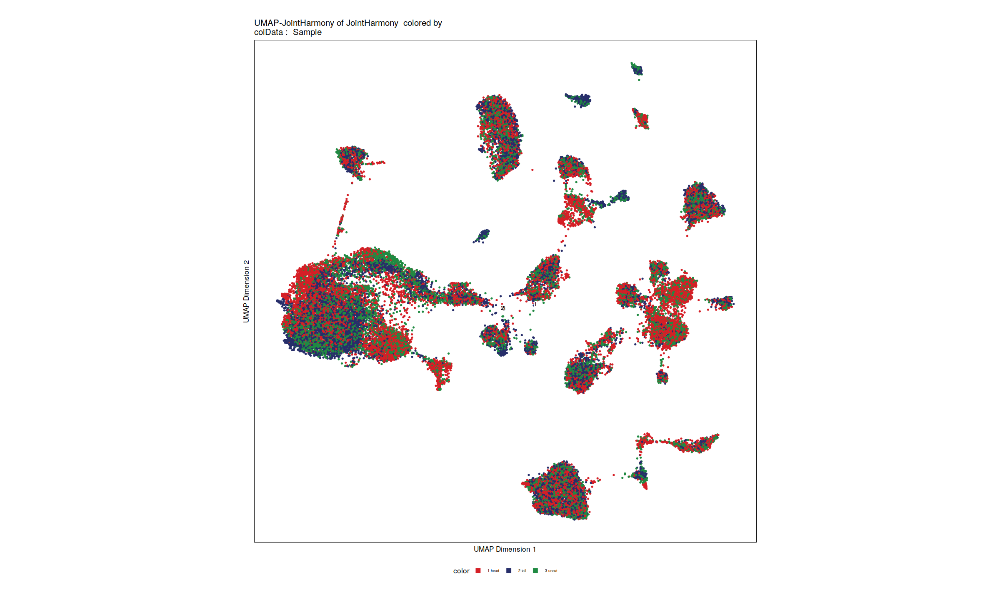

In [33]:
p <- plotEmbedding(ArchRProj = mlProj4, colorBy = "cellColData", name = "Sample", embedding = "UMAP-JointHarmony")

options(repr.plot.width=20, repr.plot.height=12)
p2

In [34]:
mlProj4 <- addClusters( input=mlProj4, reducedDims="JointHarmony", method="Seurat", 
                        name="SeuratClusters", resolution=0.8, force=T, maxClusters=NULL )

ArchR logging to : ArchRLogs/ArchR-addClusters-46754812ec49-Date-2022-07-14_Time-21-21-35.log
If there is an issue, please report to github with logFile!

Overriding previous entry for SeuratClusters

2022-07-14 21:21:35 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.001 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 37553
Number of edges: 1422721

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9330
Number of communities: 34
Elapsed time: 5 seconds


2022-07-14 21:22:20 : Testing Biased Clusters, 0.747 mins elapsed.

2022-07-14 21:22:20 : Testing Outlier Clusters, 0.752 mins elapsed.

2022-07-14 21:22:20 : Assigning Cluster Names to 34 Clusters, 0.752 mins elapsed.

2022-07-14 21:22:20 : Finished addClusters, 0.754 mins elapsed.



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-467555d3229f-Date-2022-07-14_Time-21-22-20.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-467555d3229f-Date-2022-07-14_Time-21-22-20.log



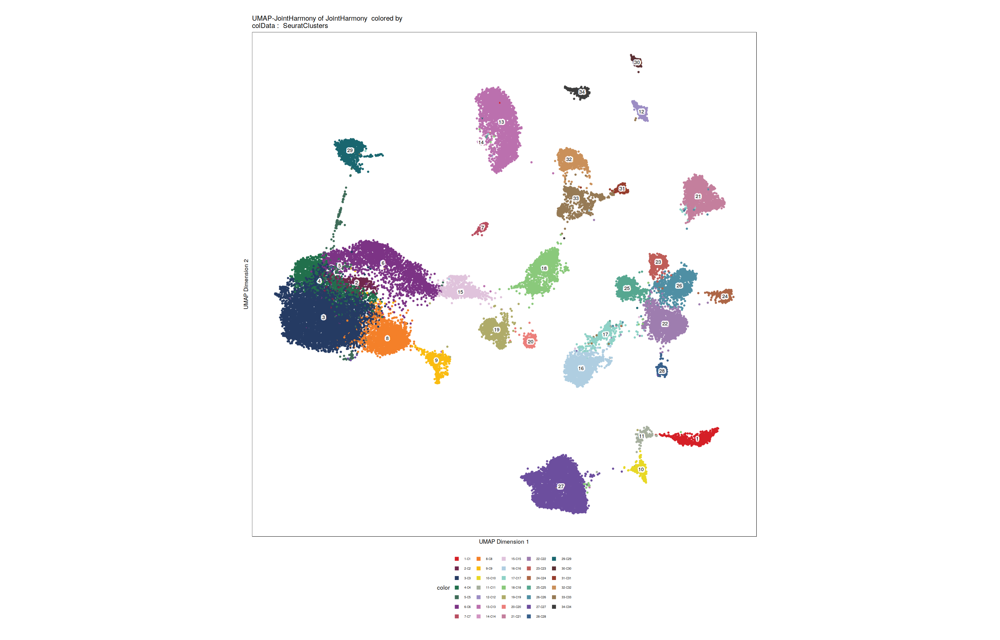

In [35]:
p <- plotEmbedding(ArchRProj = mlProj4, colorBy = "cellColData", name = "SeuratClusters", embedding = "UMAP-JointHarmony")

options(repr.plot.width=25, repr.plot.height=16)
p

Double checking the doublet enrichment stuff

Length of unique values greater than palette, interpolating..

1 


Picking joint bandwidth of 0.00884



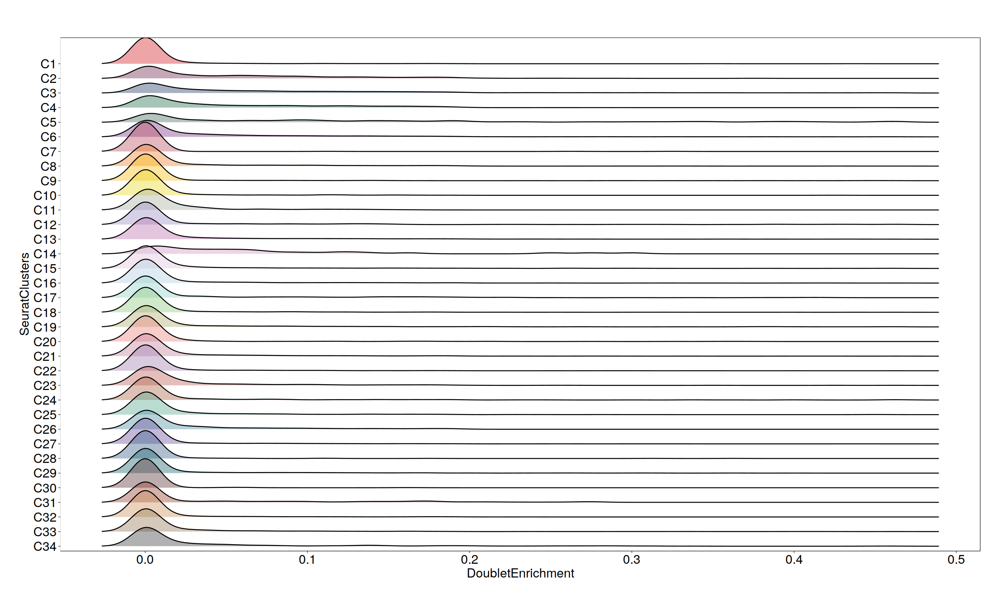

In [38]:
p1 <- plotGroups(
    ArchRProj = mlProj4, 
    groupBy = "SeuratClusters", 
    colorBy = "cellColData", 
    name = "DoubletEnrichment",
    plotAs = "ridges",
    maxCells=50000,
    alpha = 0.4,
    addBoxPlot = TRUE,
    baseSize=18
   )

p1

All of these clusters look fine in terms of doublets

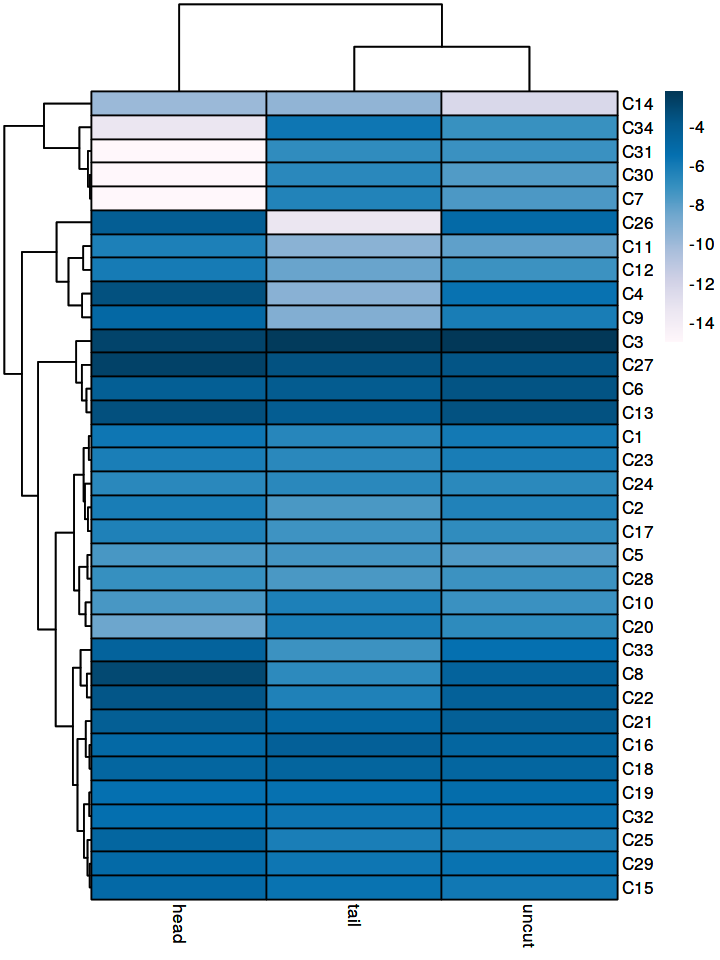

In [39]:
# Check composition of each sample (columns sum to 1)
cM <- confusionMatrix(paste0(mlProj4$SeuratClusters), paste0(mlProj4$Sample))
cM <- log2(cM / Matrix::colSums(cM))
cM[which(is.infinite(cM))] <- -15
p <- pheatmap::pheatmap(
    mat = as.matrix(cM), 
    color = paletteContinuous("whiteBlue"), 
    border_color = "black"
)
options(repr.plot.width=6, repr.plot.height=8)
p

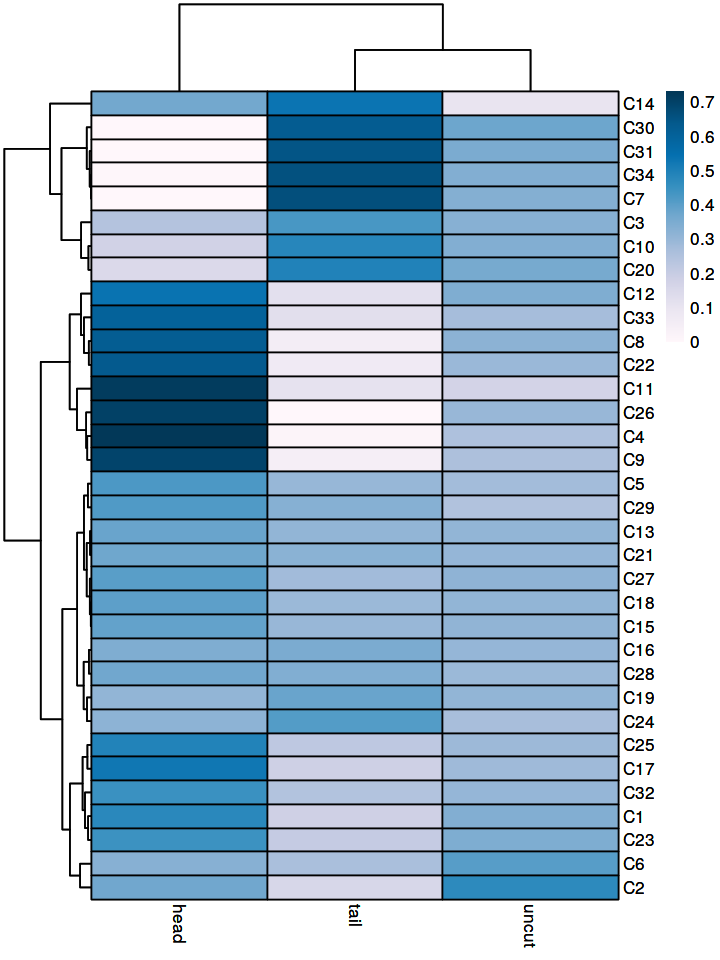

In [40]:
# Check composition of each cluster (rows sum to 1)
cM <- confusionMatrix(paste0(mlProj4$SeuratClusters), paste0(mlProj4$Sample))
cM <- cM / Matrix::rowSums(cM)
cM[which(is.infinite(cM))] <- -15
p <- pheatmap::pheatmap(
    mat = as.matrix(cM), 
    color = paletteContinuous("whiteBlue"), 
    border_color = "black"
)
options(repr.plot.width=6, repr.plot.height=8)
p

## Export gene score matrix

In [177]:
gsmat <- getMatrixFromProject( mlProj4, useMatrix="GeneScoreMatrix" )
sce <- SingleCellExperiment( list(counts=assay(gsmat)) )
rownames(sce) <- rowData( gsmat )$name
colData(sce) <- getCellColData( mlProj4, select='SeuratClusters' )

adata <- SCE2AnnData( sce )
anndata::write_h5ad( adata, "Mlig.genescores_init.h5ad" )

rm( gsmat )
rm( sce )
rm( adata )

ℹ Using the 'counts' assay as the X matrix

Warning message in private$.anndata$obs_names$name <- attr(value, "name"):
"Coercing LHS to a list"
Warning message in private$.anndata$var_names$name <- attr(value, "name"):
"Coercing LHS to a list"


## Update clusters based on SAMap

In [ ]:
uncutAnnots <- read.csv( '../../Metadata/Mlig.final_cluster_annots.csv', header=TRUE, row.names=1 )

head( uncutAnnots )

In [53]:
mlProj4 <- addCellColData( ArchRProj = mlProj4, data = uncutAnnots$GroupFigure, 
                           cells = rownames(uncutAnnots), name = "GroupFigure", force=TRUE )

mlProj4


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /media/gary/extdrv/Jesse/Mlig_Multiome/ArchR_Integration_Outputs/ArchRProjs/doubfiltered_2 
samples(3): head tail uncut
sampleColData names(1): ArrowFiles
cellColData names(23): Sample TSSEnrichment ... GroupSAMName TissueSAM
numberOfCells(1): 37553
medianTSS(1): 3.427
medianFrags(1): 4903

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-46756ec83eba-Date-2022-07-14_Time-22-53-06.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-46756ec83eba-Date-2022-07-14_Time-22-53-06.log



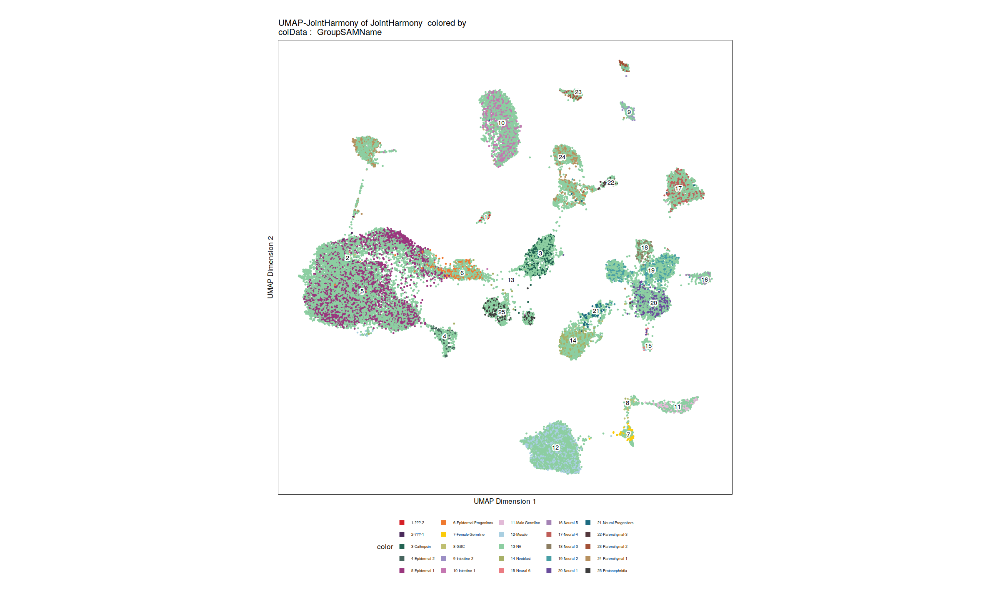

In [55]:
p <- plotEmbedding(ArchRProj = mlProj4, colorBy = "cellColData", name = "GroupFigure", 
                   embedding = "UMAP-JointHarmony")

options(repr.plot.width=20, repr.plot.height=12)
p 

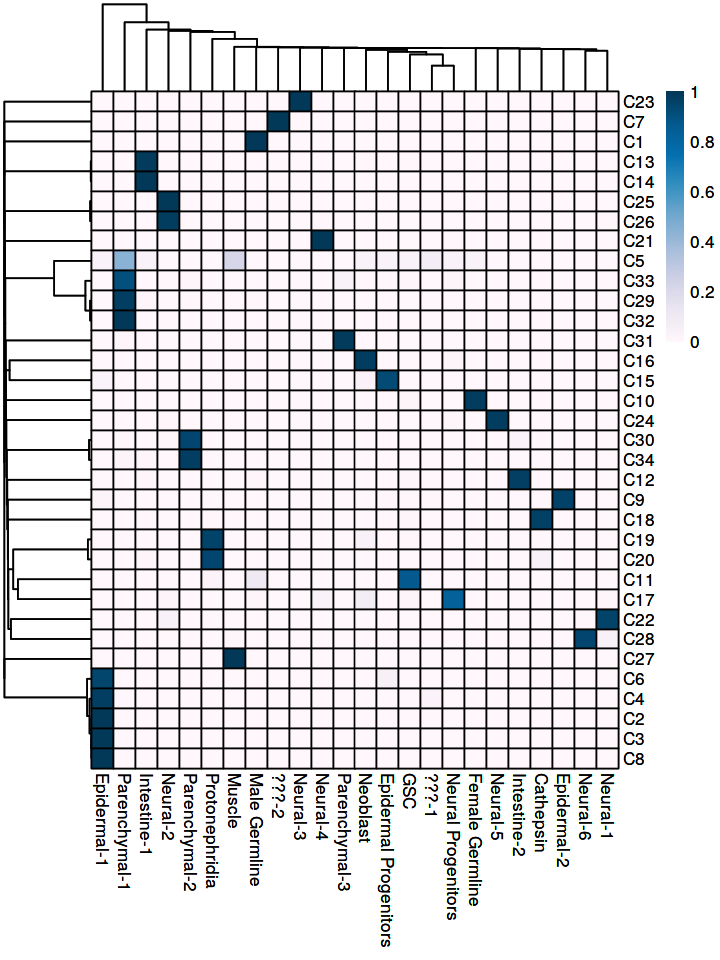

In [64]:
# Compare the updated group names with Seurat clusters
cM <- confusionMatrix(mlProj4$SeuratClusters, mlProj4$GroupSAMName)
# Remove the NA values
cM <- cM[,!is.na( colnames(cM) )]
cM <- cM / Matrix::rowSums(cM)
p <- pheatmap::pheatmap(
    mat = as.matrix(cM), 
    color = paletteContinuous("whiteBlue"), 
    border_color = "black"
)
options(repr.plot.width=6, repr.plot.height=8)
p

In [65]:
# Map each cluster to the group it has most members in
preClust <- colnames(cM)[apply(cM, 1 , which.max)]
mapping <- cbind(rownames(cM),preClust) #Assignments
mapping

,preClust
C5,Parenchymal-1
C3,Epidermal-1
C4,Epidermal-1
C6,Epidermal-1
C13,Intestine-1
C10,Female Germline
C1,Male Germline
C33,Parenchymal-1
C27,Muscle
C16,Neoblast


In [70]:
# Actually map all of the cells now
labels <- mapLabels( mlProj4$SeuratClusters, oldLabels=rownames(cM), newLabels=preClust )
labels[!is.na(mlProj4$GroupFigure)] <- mlProj4$GroupFigure[!is.na(mlProj4$GroupFigure)]
mlProj4$GroupFigure <- labels

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4675424f9041-Date-2022-07-15_Time-11-38-15.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4675424f9041-Date-2022-07-15_Time-11-38-15.log



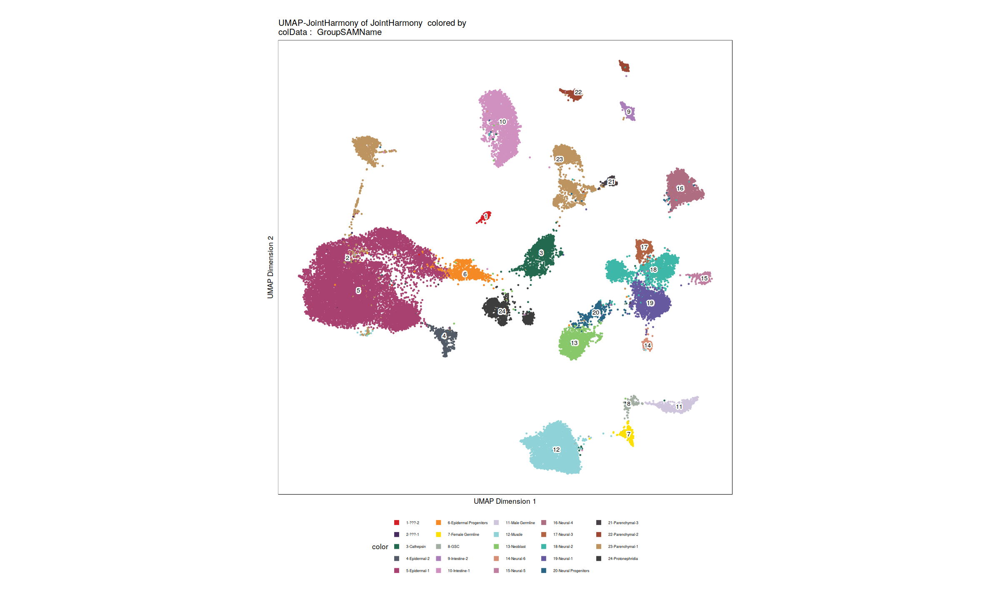

In [77]:
p2 <- plotEmbedding(ArchRProj = wrProj4, colorBy = "cellColData", 
                    name = "GroupFigure", embedding = "UMAP-JointHarmony")

options(repr.plot.width=20, repr.plot.height=12)
p2 

In [204]:
saveArchRProject(ArchRProj = mlProj4, outputDirectory = "ArchRProjs/multiome_samap_annot_1/", load = FALSE)

Copying ArchRProject to new outputDirectory : /media/gary/extdrv/Jesse/Mlig_Multiome/ArchR_Integration_Outputs/ArchRProjs/multiome_plus_annot

Copying Arrow Files...

Copying Arrow Files (1 of 3)

Copying Arrow Files (2 of 3)

Copying Arrow Files (3 of 3)

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 3): Embeddings

Copying Other Files (2 of 3): IterativeLSI

Copying Other Files (3 of 3): RNALSI

Saving ArchRProject...



In [ ]:
p <- plotEmbedding(
    mlProj4, 
    colorBy = "cellColData", 
    name = "GroupFigure", 
    embedding = "UMAP-JointHarmony"
)
options(repr.plot.width=20, repr.plot.height=12)

p <- p + theme_set(theme_classic(base_size = 15)) + labs(title = "", color = "Clusters") 
p

In [ ]:
ggsave(p, filename = "../../Plots/EDFig2/PanelED2a_Mlig.pdf", width = 10, height = 7)

After this we called peaks separately using the ENCODE pipline (see step-by-step READMEs)

# Add in the peak set

In [ ]:
peaks <- read.table("../../Peaks/Mlig.merged_peaks.narrowPeak")[,c("V1","V2","V3","V10")]
peaks <- GRanges(peaks$V1, IRanges(peaks$V2 + 1, peaks$V3), score = peaks$V10)
peaks

In [ ]:
mlProj5 <- addPeakSet( wrProj5, peaks, genomeAnno, force=T )
mlProj5 <- addPeakMatrix( mlProj5 )
mlProj5

In [ ]:
# Get GC-matched background peaks for deviations
mlProj5 <- addBgdPeaks( mlProj5, method="ArchR" )

In [ ]:
saveArchRProject( mlProj5, outputDirectory="ArchRProjs/multiome_peak_annot/" )

## Export the relevant pieces

In [ ]:
pkmat <- getMatrixFromProject( mlProj5, useMatrix="PeakMatrix" )
sce <- SingleCellExperiment( list(counts=assay(pkmat)) )
rownames(sce) <- rowData( pkmat )$name
colData(sce) <- colData( pkmat )[,c("GroupFigure")]

adata <- SCE2AnnData( sce )
anndata::write_h5ad( adata, "Mlig.peaks.h5ad" )

rm( pkmat )
rm( sce )
rm( adata )

In [ ]:
# Export the peak set again just in case ArchR does any weird rearranging/reformatting
peaks <- getPeakSet( mlProj5 )
chr_order <- sort(seqlevels(peaks))
reordered_features <- list()
for(chr in chr_order)
    reordered_features[[chr]] = peaks[seqnames(peaks) == chr]
reordered_features <- Reduce("c", reordered_features)
names(reordered_features) <- sprintf("Peak%d", 1:length(reordered_features))
write.csv(as.data.frame(reordered_features), 'Mlig.peaks.csv', quote=FALSE)
reordered_features

In [ ]:
write.table( assay( getBgdPeaks( mlProj5 ) ), file='Mlig.bgd_peaks.txt', 
             row.names=FALSE, col.names=FALSE )

# Annotate peaks with motif hits

In [ ]:
library( universalmotif )

In [ ]:
# Read in the PFMs
modisco <- read_meme( '../../motif_clustering_data/all_motif_clusters.annot.meme' )
modisco <- convert_motifs( modisco, 'TFBSTools-PWMatrix' )
modisco

In [ ]:
# Update the names so it works with ArchR
v <- list()
for (m in modisco){
    v[TFBSTools::name(m)] <- m }
modisco <- do.call(TFBSTools::PWMatrixList, v)
modisco

In [ ]:
mlProj5 <- addMotifAnnotations( mlProj5, motifPWMs=modisco, 
                                name="ModiscoMotifs", 
                                force=TRUE, cutOff=1e-5 )

## Export

In [ ]:
matches <- readRDS( getPeakAnnotation( wrProj5, 'ModiscoMotifs' )$Matches )
sce <- SingleCellExperiment( list(counts=assay(matches)) )
rowData(sce) <- rowData(matches)
colnames(sce) <- colnames(matches)

adata <- SCE2AnnData( sce )
anndata::write_h5ad( adata, "../../FilteredPeakMotifHits/Mlig.raw_peak_motif_hits.h5ad" )

rm( matches )
rm( sce )
rm( adata )

In [ ]:
saveArchRProject( mlProj5, outputDirectory="ArchRProjs/Mlig_final_ArchR_proj/" )